In [2]:
import os
import cv2
import math
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import hickle as hkl
import keras_video.utils
import keras

from keras_video import VideoFrameGenerator
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, CSVLogger, ReduceLROnPlateau
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.models import load_model

# Step 1 : Visualize the Data with its Labels

In [3]:
HOME = os.getcwd()
Main_Video_Path = HOME + '/project_databases/Real Life Violence Dataset'

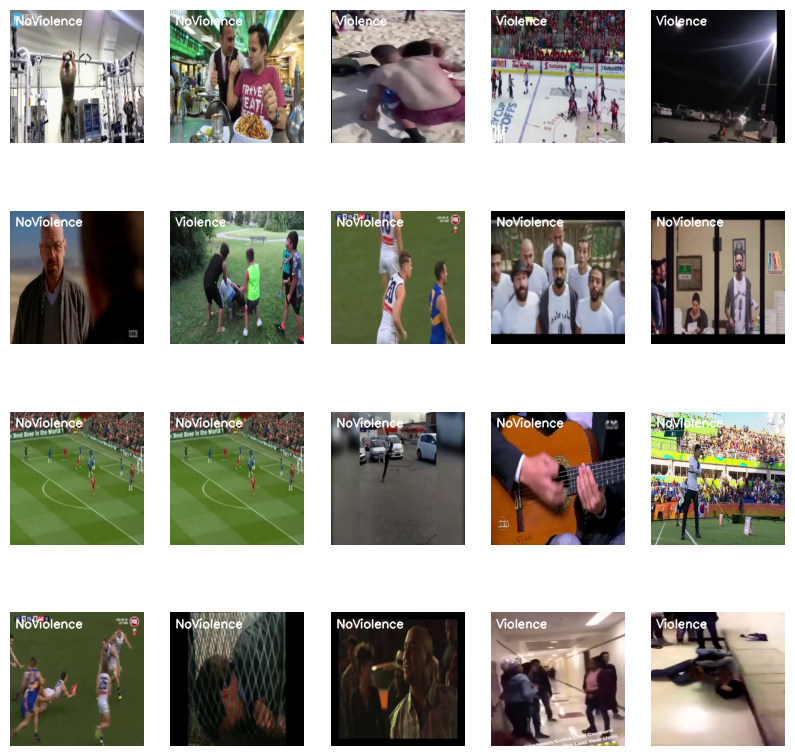

In [5]:
plt.figure(figsize = (10, 10))


FONT_SCALE = 3e-3
THICKNESS_SCALE = 5e-3

# Get the names of all classes/categories in Real Life Violence Dataset.
all_classes_names = os.listdir(Main_Video_Path)
 
# Generate a list of 20 random values. The values will be between 0-1, 
# where 0 or 1 represent an index of class name in the dataset. 
random_range = random.choices([0, 1], k=20)
 
# Iterating through all the generated random values.
for counter, random_index in enumerate(random_range, 1):
 
    # Retrieve a Class Name using the Random Index.
    selected_class_Name = all_classes_names[random_index]
 
    # Retrieve the list of all the video files present in the randomly selected Class Directory.
    video_files_names_list = os.listdir(f'{Main_Video_Path}/{selected_class_Name}')
 
    # Randomly select a video file from the list retrieved from the randomly selected Class Directory.
    selected_video_file_name = random.choice(video_files_names_list)
 
    # Initialize a VideoCapture object to read from the video File.
    video_reader = cv2.VideoCapture(f'{Main_Video_Path}/{selected_class_Name}/{selected_video_file_name}')
    
    # Read the first frame of the video file.
    _, bgr_frame = video_reader.read()
 
    # Release the VideoCapture object. 
    video_reader.release()
 
    # Convert the frame from BGR into RGB format. 
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
    rgb_frame = cv2.resize(rgb_frame, (256,256))

    height, width, _ = rgb_frame.shape
    
    font_scale = min(width, height) * FONT_SCALE
    thickness = math.ceil(min(width, height) * THICKNESS_SCALE)
 
    # Write the class name on the video frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), thickness)
    
    # Display the frame.
    plt.subplot(4, 5, counter);plt.imshow(rgb_frame);plt.axis('off')

## Step 2 : Preprocess the dataset using VideoFrameGenerator

In [4]:
# some global params
SIZE = (224, 224)
CHANNELS = 3
NBFRAME = 20
BS = 16
CLASSES_LIST = ["NoViolence", "Violence"]

# pattern to get videos and classes
glob_pattern='./project_databases/Real Life Violence Dataset/{classname}/*.mp4'
# for data augmentation
data_aug = keras.preprocessing.image.ImageDataGenerator(
    zoom_range=.1,
    horizontal_flip=True,
    rotation_range=8,
    width_shift_range=.2,
    height_shift_range=.2)

# Create video frame generator
train = VideoFrameGenerator(
    rescale = 1./255,
    classes=CLASSES_LIST, 
    glob_pattern=glob_pattern,
    nb_frames=NBFRAME,
    split_val=.2,
    split_test=.1, 
    shuffle=True,
    batch_size=BS,
    target_shape=SIZE,
    nb_channel=CHANNELS,
    transformation=None,
    use_frame_cache=True)

valid_gen = train.get_validation_generator()
test_gen = train.get_test_generator()

class NoViolence, validation count: 190, test count: 76, train count: 685
class Violence, validation count: 200, test count: 80, train count: 720
Total data: 2 classes for 1405 files for train
Total data: 2 classes for 390 files for validation
Total data: 2 classes for 156 files for test


In [6]:
# Saving the data after splitting 
data = {'train':train, 'valid':valid_gen, 'test':test_gen}
hkl.dump(data,'LRCN_data.hkl')

## Frames sequence example from train set

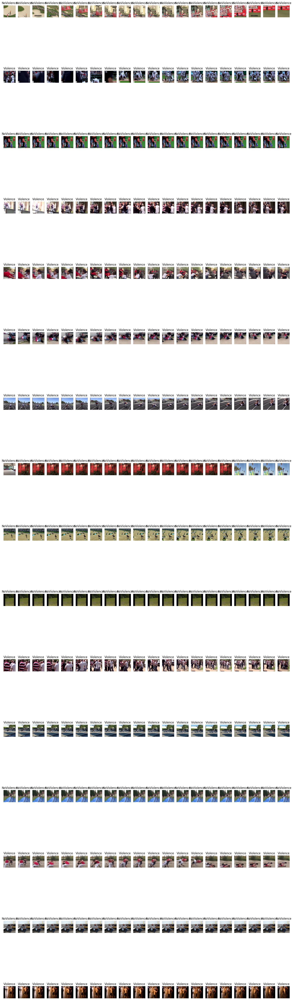

In [17]:
keras_video.utils.show_sample(train)

# Step 3 : Implement the LRCN Approach

### Step 3.1 : Construct the Model

In [8]:
VIDSHAPE=(NBFRAME,) + SIZE + (CHANNELS,)

base_model = InceptionV3(include_top=False,weights='imagenet',input_shape=(224 , 224, 3))

for layer in base_model.layers:
    layer.trainable = False

cnn = Sequential()
cnn.add(base_model)
cnn.add(Flatten())


model = Sequential()

model.add(TimeDistributed(cnn,  input_shape=VIDSHAPE))
model.add(LSTM(40 , return_sequences=True))

model.add(GlobalAveragePooling1D(name="globale"))
model.add(Dense(2, activation="softmax" , name="last"))

### Step 3.2 : Compile & Train the Model

In [9]:
optimizer = SGD()
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=["accuracy"])
model.summary()

earlyStopping = EarlyStopping(monitor='val_loss', patience=15, mode='min', restore_best_weights = True)
mcp_save = ModelCheckpoint('LRCN.h5', save_best_only=True, monitor='val_loss', mode='min')
reduce_lr_loss = ReduceLROnPlateau(monitor='val_loss',patience=3, verbose=1,factor=0.5)
csv_logger = CSVLogger('LRCN.log', separator=',', append=True)


model.fit_generator(
    train,
    validation_data=valid_gen,
    verbose=1,
    epochs=20,
    callbacks=[earlyStopping, mcp_save, csv_logger]
)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_1 (TimeDi  (None, 20, 51200)         21802784  
 stributed)                                                      
                                                                 
 lstm_1 (LSTM)               (None, 20, 40)            8198560   
                                                                 
 globale (GlobalAveragePool  (None, 40)                0         
 ing1D)                                                          
                                                                 
 last (Dense)                (None, 2)                 82        
                                                                 
Total params: 30001426 (114.45 MB)
Trainable params: 8198642 (31.28 MB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


/tmp/ipykernel_1670220/910402405.py:11: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(


Epoch 1/20
40/87 [============>.................] - ETA: 2:42 - loss: 0.5580 - accuracy: 0.7328

[h264 @ 0x7f22f796c280] mb_type 104 in P slice too large at 98 31
[h264 @ 0x7f22f796c280] error while decoding MB 98 31


87/87 [==============================] - ETA: 0s - loss: 0.4672 - accuracy: 0.7881

/home/carmeladmoni/miniconda3/lib/python3.9/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


87/87 [==============================] - 406s 5s/step - loss: 0.4672 - accuracy: 0.7881 - val_loss: 0.2855 - val_accuracy: 0.8880
Epoch 2/20
87/87 [==============================] - 317s 4s/step - loss: 0.2385 - accuracy: 0.9109 - val_loss: 0.3079 - val_accuracy: 0.8646
Epoch 3/20
87/87 [==============================] - 320s 4s/step - loss: 0.1696 - accuracy: 0.9447 - val_loss: 0.2110 - val_accuracy: 0.9141
Epoch 4/20
87/87 [==============================] - 319s 4s/step - loss: 0.1374 - accuracy: 0.9655 - val_loss: 0.1658 - val_accuracy: 0.9453
Epoch 5/20
87/87 [==============================] - 318s 4s/step - loss: 0.1243 - accuracy: 0.9648 - val_loss: 0.2496 - val_accuracy: 0.8854
Epoch 6/20
87/87 [==============================] - 318s 4s/step - loss: 0.0706 - accuracy: 0.9813 - val_loss: 0.2313 - val_accuracy: 0.8932
Epoch 7/20
87/87 [==============================] - 320s 4s/step - loss: 0.0596 - accuracy: 0.9828 - val_loss: 0.1415 - val_accuracy: 0.9349
Epoch 8/20
87/87 [======

### Step 3.3 : Plot Model’s Loss & Accuracy Curves

In [3]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history[metric_name_1]
    metric_value_2 = model_training_history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))

    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)

    # Add title to the plot.
    plt.title(str(plot_name))

    # Add x,y axis labels to the plot.
    plt.xlabel('epoch')
    plt.ylabel(metric_name_1)
    plt.legend()

    plt.show()

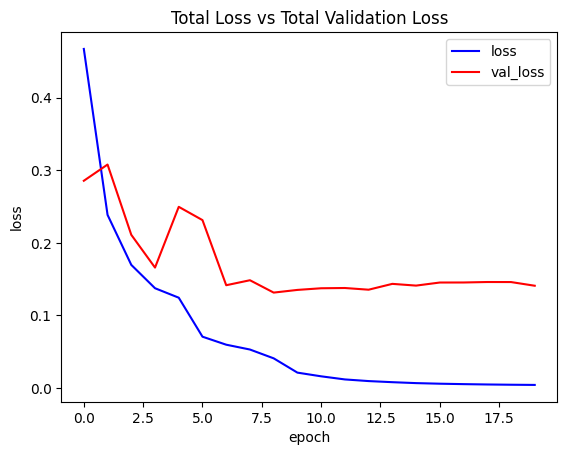

In [4]:
# Visualize the training and validation loss metrices.
LRCN_model_training_history = pd.read_csv('LRCN.log', sep=',', engine='python')
plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

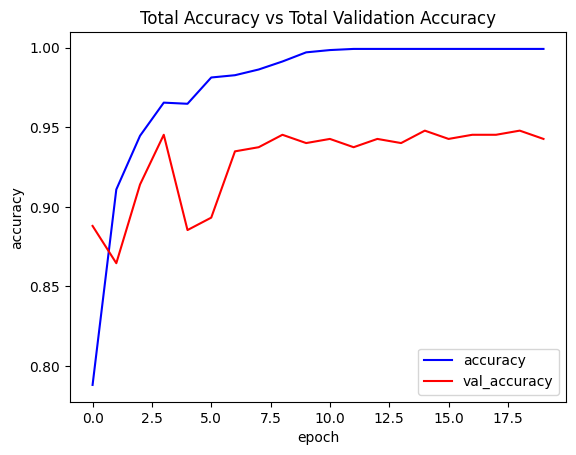

In [5]:
# Visualize the training and validation accuracy metrices.
plot_metric(LRCN_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

### Step 3.4 : Evaluate results on test and validation set

In [11]:
results = model.evaluate(valid_gen , verbose=1)

24/24 [==============================] - 67s 3s/step - loss: 0.1434 - accuracy: 0.9427


## Step 4 : Prediction on single video

In [156]:
# Loading the model
LRCN = load_model('LRCN.h5')

In [9]:
def predict_single_action(model, video_file_path, SEQUENCE_LENGTH=20):
    '''
    This function will perform single action recognition prediction on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''
    
    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_in_color = []
    normalized_frames = []
    
    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Read a frame.
        success, frame = video_reader.read() 

        # Check if frame is not read properly then break the loop.
        if not success:
            break
        
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (224, 224))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        normalized_frames.append(normalized_frame)

        # for displaing results
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames_in_color.append(frame_rgb)

    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frames, axis = 0), verbose=0)[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)
    
    # Release the VideoCapture object. 
    video_reader.release()

    return predicted_label, predicted_labels_probabilities[predicted_label], frames_in_color

In [153]:
def show_result_with_frames(frames_in_color, predicted_label=None, prob=None, result=True):

    CLASSES_LIST = ["NoViolence", "Violence"]
    frames_per_row = 5
    
    # Display frames in rows with no spaces between them
    num_rows = len(frames_in_color) // frames_per_row + (len(frames_in_color) % frames_per_row > 0)
    
    # Adjust figsize and remove spaces between subplots
    frame_height, frame_width, _ = frames_in_color[0].shape
    total_width = frame_width * frames_per_row
    total_height = frame_height * num_rows
    
    figsize = (total_width / 100, total_height / 100) 
    fig, axs = plt.subplots(num_rows, frames_per_row, figsize=figsize)
    plt.subplots_adjust(wspace=0, hspace=0)

    header_text = ""
    color = 'black'
    if predicted_label and prob:
        pred_prob =  "{:.2f}".format(prob*100)
        pred_label = CLASSES_LIST[predicted_label]
        header_text = f"{pred_label} content , {pred_prob}%"
        color = 'red' if pred_label=="Violence" else 'green'

    # Add header with results on the frames
    if result:
        axs[0, 0].text(0, 1.2, header_text, transform=axs[0, 0].transAxes, fontsize=52, ha='center', color=color)
    
    for i in range(len(frames_in_color)):
    
        row_idx = i // frames_per_row
        col_idx = i % frames_per_row

        axs[row_idx, col_idx].imshow(frames_in_color[i])
        axs[row_idx, col_idx].axis('off')
        
    plt.show()

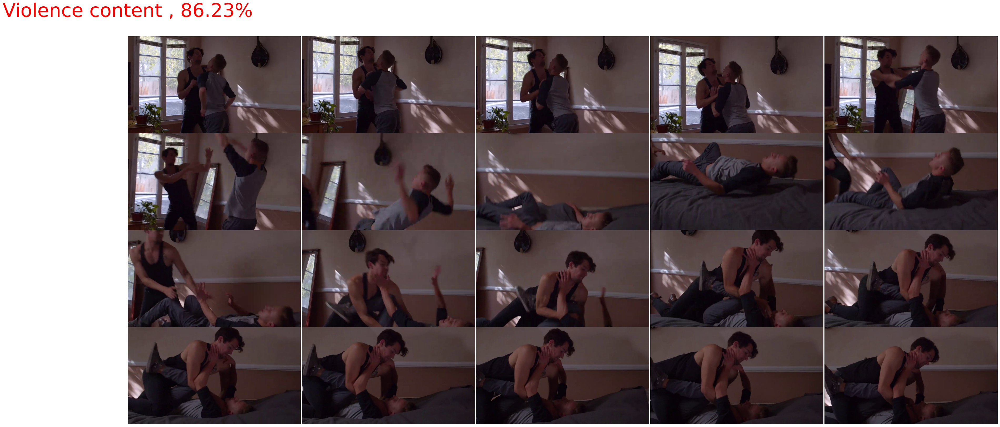

In [49]:
### Add example of video
label, prob, colored_frames = predict_single_action(LRCN, "./project_databases/movies/V_3.mp4")
show_result_with_frames(colored_frames, label, prob)